In [1]:
### Extract the text of each review and convert to a list 

In [2]:
import pandas as pd

# Load the dataset
data = pd.read_csv('/content/reviews1.csv')
data.columns

Index(['reviewId', 'userName', 'userImage', 'review', 'rating', 'helpfulCount',
       'reviewCreatedVersion', 'date', 'replyContent', 'repliedAt'],
      dtype='object')

In [3]:
data.head(2)

,reviewId,userName,userImage,review,rating,helpfulCount,reviewCreatedVersion,date,replyContent,repliedAt
0,cc242cbe-301e-4c00-81c8-5c3fd6b32439,Cindy Barr,https://play-lh.googleusercontent.com/a/AGNmyx...,Very helpful through co-vid and the loss of my...,5,1,3.0.11,2023-02-08 20:33:26,Thank you so much for your review. Sending you...,2023-03-01 20:42:19
1,67c7b44e-946c-48e3-ae43-8c2942d2a533,C. Adams III,https://play-lh.googleusercontent.com/a-/ACB-R...,Why new permission without reason? Added finsk...,1,5,3.0.10,2023-02-02 17:40:20,Hi – This Advertising ID permission was added ...,2023-03-03 21:59:33


In [4]:
# Select the review text column
reviews = data['review'].tolist()

In [5]:
helpful = data['helpfulCount'].tolist()

In [6]:
reviews[0]

'Very helpful through co-vid and the loss of my husband so now I can be more prepared for whatever life hands me. Thank You! Cindy Barr'

In [7]:
### Using spacy to extract relevant entities and dependencies

In [8]:
import matplotlib.pyplot as plt

In [9]:
!pip install karateclub==1.0.19

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.8/54.8 KB 7.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 60.2 MB/s eta 0:00:00
  Created wheel for karateclub: filename=karateclub-1.0.19-py3-none-any.whl size=90799 sha256=f62fdfd002d89962f84136e073934c2823306c8a1d598de8fa7fa64bed404cf8
  Stored in directory: /root/.cache/pip/wheels/31/b1/b9/7a526c1e61617dc4c8a71a66be8ad256666c0cb8d92d94edae
Successfully built karateclub


In [10]:
import spacy

# Load the English language model
nlp = spacy.load('en_core_web_sm')

/usr/local/lib/python3.9/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [11]:
!pip install node2vec

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 44.2 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 3.0
    Uninstalling networkx-3.0:
      Successfully uninstalled networkx-3.0


In [12]:
from node2vec import Node2Vec
import numpy as np

In [13]:
import networkx as nx

In [14]:
from gensim.models import Word2Vec

In [15]:
def graph_embedding(node_embeddings):
    # convert the numpy array to a dictionary
    node_embeddings1 = {i: node_embeddings[i] for i in range(len(node_embeddings))}
    # access the embedding vectors using .values()
    embedding_vectors = list(node_embeddings1.values())
    # take the average of the node embeddings along the rows
    graph_embedding = np.mean(embedding_vectors, axis=0)
    return graph_embedding

In [16]:
### If you need to visualize the graph, use the following code
    #plt.title("Knowledge Subgraph for Review: " + review)
    #pos = nx.spring_layout(G)
    #nx.draw_networkx_nodes(G, pos)
    #nx.draw_networkx_labels(G, pos)
    #nx.draw_networkx_edges(G, pos)
    #plt.show()

In [17]:
### Applying the logic to all the reviews

In [18]:
# Set node2vec hyperparameters
p = 1  # Return parameter
q = 0.5  # In-out parameter
dimensions = 16  # Embedding dimensions
num_walks = 10  # Number of walks per node
walk_length = 80  # Length of each walk
workers = 4  # Number of parallel workers

In [19]:
graph_list = []
review_list = []
for review in reviews:
    # Perform text preprocessing and entity recognition using spaCy
    #doc = nlp(review)
    doc = nlp(str(review))

    # Extract relevant entities and their relationships from the text
    entities = [(entity.text, entity.label_) for entity in doc.ents]
    edges = []
    for token in doc:
        if token.dep_ in ['nsubj', 'dobj', 'iobj']:
            if token.head.pos_ == 'VERB':
                edges.append((token.head.text, token.text))
            elif token.head.pos_ == 'NOUN':
                edges.append((token.head.text, token.text))

    # Create a knowledge subgraph for the current review
    G = nx.Graph()
    for entity, entity_type in entities:
        G.add_node(entity, type=entity_type)
    for edge in edges:
        G.add_edge(edge[0], edge[1])
    #print(G)
    graph_list.append(G)
    review_list.append(review)

In [20]:
len(graph_list)

775

In [21]:
len(review_list)

775

In [22]:
len(helpful)

775

In [23]:
position_list = []
for G in graph_list:
  if len(G.nodes) == 0:
    position_list.append(graph_list.index(G))
    #graph_list.remove(G)

In [24]:
for index in reversed(position_list):
    del graph_list[index]

In [25]:
len(graph_list)

628

In [26]:
for index in reversed(position_list):
    del review_list[index]

In [27]:
#for j in position_list:
  #rev = review_list[j]
  #review_list.remove(rev)

In [28]:
len(review_list)

628

In [29]:
for index in reversed(position_list):
    del helpful[index]

In [30]:
len(helpful)

628

In [31]:
#for j in position_list:
  #hel = helpful[j]
  #helpful.remove(hel)

In [32]:
for G in graph_list:
  print(G)

Graph with 6 nodes and 3 edges
Graph with 7 nodes and 3 edges
Graph with 6 nodes and 4 edges
Graph with 23 nodes and 17 edges
Graph with 22 nodes and 10 edges
Graph with 9 nodes and 5 edges
Graph with 21 nodes and 13 edges
Graph with 9 nodes and 5 edges
Graph with 6 nodes and 4 edges
Graph with 25 nodes and 17 edges
Graph with 10 nodes and 6 edges
Graph with 5 nodes and 2 edges
Graph with 18 nodes and 10 edges
Graph with 17 nodes and 9 edges
Graph with 13 nodes and 8 edges
Graph with 16 nodes and 10 edges
Graph with 4 nodes and 2 edges
Graph with 11 nodes and 5 edges
Graph with 13 nodes and 8 edges
Graph with 9 nodes and 4 edges
Graph with 3 nodes and 2 edges
Graph with 19 nodes and 12 edges
Graph with 8 nodes and 5 edges
Graph with 2 nodes and 0 edges
Graph with 9 nodes and 5 edges
Graph with 11 nodes and 6 edges
Graph with 2 nodes and 1 edges
Graph with 24 nodes and 14 edges
Graph with 2 nodes and 1 edges
Graph with 12 nodes and 6 edges
Graph with 14 nodes and 9 edges
Graph with 25 n

In [33]:
i = 0
embedding_list=[]
for G in graph_list:
  print(G)
  i = i + 1
  print(i)
  # Apply node2vec to each connected component
  embeddings = []
  components = list(nx.connected_components(G))
  #print(components)
  for component in components:
    subgraph = G.subgraph(component)
    node2vec = Node2Vec(subgraph, dimensions=dimensions, walk_length=walk_length, num_walks=num_walks, p=p, q=q, workers=workers)
    model = node2vec.fit(window=10, min_count=1, batch_words=4)
    embeddings.append(model.wv.vectors)
  # Combine embeddings of all connected components
  total_embedding = np.concatenate(embeddings)
  total_graph_embedding = graph_embedding(total_embedding)
  #total_graph_embedding = np.append(total_graph_embedding,helpfulness)
  #print(total_graph_embedding)
  embedding_list.append(total_graph_embedding)
  
    


      #embeddings[node] = np.append(embeddings[node], helpfulness[i])
      ### print(embeddings)

Graph with 6 nodes and 3 edges
1


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
2


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
3


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 23 nodes and 17 edges
4


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 22 nodes and 10 edges
5


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
6


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 21 nodes and 13 edges
7


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
8


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
9


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 25 nodes and 17 edges
10


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
11


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
12


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 18 nodes and 10 edges
13


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 17 nodes and 9 edges
14


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
15


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 10 edges
16


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
17


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 5 edges
18


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
19


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 4 edges
20


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
21


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 19 nodes and 12 edges
22


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
23


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 0 edges
24


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
25


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 6 edges
26


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
27


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 24 nodes and 14 edges
28


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
29


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 6 edges
30


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 9 edges
31


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 25 nodes and 15 edges
32


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
33


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
34


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
35


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
36


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 3 edges
37


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 29 nodes and 11 edges
38


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
39


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 6 edges
40


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 26 nodes and 17 edges
41


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
42


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 7 edges
43


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 22 nodes and 13 edges
44


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
45


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 18 nodes and 14 edges
46


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
47


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
48


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
49


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 22 nodes and 12 edges
50


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
51


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
52


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 25 nodes and 18 edges
53


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
54


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
55


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 22 nodes and 15 edges
56


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 6 edges
57


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 19 nodes and 15 edges
58


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 6 edges
59


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
60


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 15 nodes and 9 edges
61


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 5 edges
62


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
63


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
64


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
65


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 8 edges
66


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 2 edges
67


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
68


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 23 nodes and 14 edges
69


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 12 nodes and 7 edges
70


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 17 nodes and 10 edges
71


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 14 nodes and 7 edges
72


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 4 edges
73


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 17 nodes and 12 edges
74


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 17 nodes and 9 edges
75


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
76


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 5 edges
77


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 1 edges
78


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 31 nodes and 20 edges
79


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
80


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 9 edges
81


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 17 nodes and 9 edges
82


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 5 edges
83


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
84


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
85


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 2 edges
86


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
87


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 4 edges
88


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
89


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 7 edges
90


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
91


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 5 edges
92


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 5 edges
93


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 4 edges
94


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
95


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 14 nodes and 8 edges
96


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 18 nodes and 15 edges
97


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
98


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
99


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 8 edges
100


Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
101


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 5 edges
102


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 20 nodes and 14 edges
103


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
104


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
105


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
106


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
107


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
108


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
109


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 7 edges
110


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 23 nodes and 19 edges
111


Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 26 nodes and 15 edges
112


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
113


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
114


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
115


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 3 edges
116


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 18 nodes and 11 edges
117


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
118


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
119


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 31 nodes and 18 edges
120


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
121


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
122


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
123


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
124


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
125


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
126


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
127


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
128


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
129


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 16 nodes and 10 edges
130


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 21 nodes and 10 edges
131


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
132


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 6 edges
133


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
134


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
135


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
136


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 8 edges
137


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Graph with 12 nodes and 6 edges
138


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
139


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
140


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 21 nodes and 13 edges
141


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
142


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 8 edges
143


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
144


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
145


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
146


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
147


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 7 edges
148


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
149


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 7 edges
150


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
151


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 2 edges
152


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
153


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
154


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 6 edges
155


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
156


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 11 edges
157


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 3 edges
158


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
159


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
160


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
161


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 17 nodes and 11 edges
162


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
163


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 20 nodes and 13 edges
164


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/10 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
165


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
166


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
167


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
168


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
169


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
170


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
171


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
172


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 0 edges
173


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
174


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
175


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
176


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
177


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
178


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
179


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
180


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
181


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 4 edges
182


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
183


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
184


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
185


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 4 nodes and 1 edges
186


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 8 edges
187


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
188


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 16 nodes and 7 edges
189


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
190


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
191


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 19 nodes and 11 edges
192


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
193


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
194


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
195


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
196


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 27 nodes and 13 edges
197


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
198


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 15 nodes and 9 edges
199


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
200


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 23 nodes and 15 edges
201


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/10 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
202


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
203


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 5 edges
204


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
205


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
206


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 4 edges
207


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
208


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 7 edges
209


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
210


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
211


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
212


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
213


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 15 nodes and 10 edges
214


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
215


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
216


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 17 nodes and 12 edges
217


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 0 edges
218


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
219


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 4 edges
220


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
221


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
222


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
223


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 15 nodes and 9 edges
224


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 21 nodes and 8 edges
225


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
226


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 15 nodes and 10 edges
227


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 9 nodes and 4 edges
228


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 7 edges
229


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
230


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 15 nodes and 10 edges
231


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
232


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 10 edges
233


Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
234


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 9 nodes and 3 edges
235


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
236


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
237


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
238


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
239


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
240


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
241


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
242


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
243


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
244


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 6 edges
245


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
246


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
247


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
248


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
249


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
250


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 4 edges
251


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
252


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
253


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 11 edges
254


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 13 nodes and 5 edges
255


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
256


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 15 nodes and 9 edges
257


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
258


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
259


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 4 edges
260


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
261


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 5 edges
262


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
263


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
264


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 22 nodes and 11 edges
265


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 19 nodes and 11 edges
266


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
267


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
268


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 4 nodes and 3 edges
269


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 2 edges
270


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 18 nodes and 11 edges
271


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
272


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
273


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
274


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
275


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
276


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 32 nodes and 10 edges
277


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
278


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
279


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
280


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
281


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
282


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
283


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 9 nodes and 4 edges
284


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 8 edges
285


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 6 edges
286


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Graph with 5 nodes and 0 edges
287


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 11 nodes and 5 edges
288


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 7 edges
289


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
290


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
291


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
292


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 5 edges
293


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
294


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
295


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 21 nodes and 9 edges
296


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
297


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 11 nodes and 6 edges
298


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
299


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
300


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
301


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
302


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
303


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
304


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
305


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 7 edges
306


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
307


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
308


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 5 edges
309


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
310


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
311


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 19 nodes and 11 edges
312


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
313


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
314


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
315


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 20 nodes and 10 edges
316


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
317


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
318


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 23 nodes and 13 edges
319


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 4 edges
320


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 20 nodes and 13 edges
321


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 15 nodes and 9 edges
322


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 11 nodes and 5 edges
323


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
324


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
325


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
326


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 17 nodes and 9 edges
327


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
328


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
329


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 15 nodes and 10 edges
330


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
331


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
332


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 4 nodes and 3 edges
333


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 11 nodes and 6 edges
334


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 6 edges
335


Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
336


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 8 edges
337


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
338


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
339


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
340


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
341


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
342


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
343


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
344


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
345


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
346


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
347


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 0 edges
348


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
349


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 9 edges
350


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 9 edges
351


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 20 nodes and 13 edges
352


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
353


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
354


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 0 edges
355


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
356


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
357


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
358


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 6 edges
359


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 15 nodes and 10 edges
360


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
361


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
362


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
363


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 19 nodes and 11 edges
364


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
365


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
366


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
367


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
368


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
369


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 6 nodes and 1 edges
370


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
371


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
372


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
373


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 18 nodes and 13 edges
374


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Graph with 11 nodes and 7 edges
375


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
376


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 5 edges
377


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
378


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
379


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 16 nodes and 11 edges
380


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 4 edges
381


Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
382


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
383


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
384


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 9 edges
385


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
386


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 18 nodes and 10 edges
387


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
388


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
389


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 9 edges
390


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
391


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
392


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 7 edges
393


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 9 edges
394


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
395


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
396


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
397


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 5 edges
398


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
399


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
400


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
401


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 7 edges
402


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
403


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 7 edges
404


Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
405


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
406


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
407


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
408


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 14 nodes and 7 edges
409


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
410


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 19 nodes and 10 edges
411


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
412


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
413


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
414


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
415


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
416


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
417


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
418


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
419


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
420


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
421


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
422


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
423


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
424


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
425


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 26 nodes and 14 edges
426


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
427


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 9 edges
428


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
429


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 7 nodes and 2 edges
430


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
431


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 11 nodes and 8 edges
432


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 8 edges
433


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
434


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
435


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
436


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 6 edges
437


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
438


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
439


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
440


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 13 nodes and 10 edges
441


Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
442


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
443


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
444


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 4 edges
445


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
446


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 21 nodes and 12 edges
447


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
448


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
449


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
450


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
451


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 6 edges
452


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 13 nodes and 9 edges
453


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 18 nodes and 11 edges
454


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
455


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 28 nodes and 18 edges
456


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
457


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
458


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
459


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
460


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
461


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 18 nodes and 13 edges
462


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
463


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 19 nodes and 14 edges
464


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/10 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
465


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 13 nodes and 9 edges
466


Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
467


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
468


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
469


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
470


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 31 nodes and 23 edges
471


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
472


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 10 nodes and 8 edges
473


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
474


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 11 nodes and 5 edges
475


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
476


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 18 nodes and 15 edges
477


Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
478


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
479


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
480


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 6 edges
481


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
482


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
483


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 5 edges
484


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 1 edges
485


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
486


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 5 edges
487


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
488


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 26 nodes and 16 edges
489


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 6 edges
490


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
491


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 10 edges
492


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
493


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
494


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
495


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 15 nodes and 11 edges
496


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
497


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
498


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
499


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
500


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
501


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
502


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
503


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
504


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
505


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
506


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 9 nodes and 6 edges
507


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
508


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
509


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
510


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 16 nodes and 9 edges
511


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 12 nodes and 7 edges
512


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
513


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 6 edges
514


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
515


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 8 edges
516


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
517


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
518


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 15 nodes and 9 edges
519


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
520


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 11 edges
521


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 18 nodes and 10 edges
522


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
523


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 12 nodes and 11 edges
524


Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Graph with 4 nodes and 3 edges
525


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 12 nodes and 7 edges
526


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
527


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
528


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
529


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
530


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
531


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
532


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
533


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
534


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
535


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 7 edges
536


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
537


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 6 edges
538


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
539


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
540


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 4 edges
541


Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 12 nodes and 7 edges
542


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
544


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
545


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
546


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Graph with 10 nodes and 6 edges
547


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
548


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 4 edges
549


Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Graph with 17 nodes and 9 edges
550


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
551


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 7 edges
552


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
553


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
554


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 15 nodes and 8 edges
555


Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 10 edges
556


Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
557


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
558


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 6 edges
559


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 7 edges
560


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
561


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 16 nodes and 10 edges
562


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 5 edges
563


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 7 edges
564


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 9 nodes and 5 edges
565


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 22 nodes and 10 edges
566


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
567


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
568


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 7 nodes and 5 edges
569


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 9 nodes and 6 edges
570


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Graph with 12 nodes and 6 edges
571


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
572


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 6 nodes and 3 edges
573


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 26 nodes and 19 edges
574


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 5 edges
575


Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
576


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
577


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 9 nodes and 4 edges
578


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 11 nodes and 7 edges
579


Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
580


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 13 nodes and 8 edges
581


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
582


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 4 edges
584


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 10 nodes and 5 edges
585


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
586


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
587


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
588


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
589


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
590


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
591


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
592


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
593


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 5 edges
594


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 31 nodes and 18 edges
595


Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
596


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
597


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
598


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 0 edges
599


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
600


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
601


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
602


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 5 nodes and 2 edges
603


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
604


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 14 nodes and 7 edges
605


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
606


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
607


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 9 nodes and 3 edges
608


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 1 edges
609


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
610


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 2 nodes and 0 edges
611


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
612


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
613


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 10 nodes and 4 edges
614


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 8 nodes and 4 edges
615


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
616


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 6 nodes and 4 edges
617


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
618


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 5 nodes and 3 edges
619


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 7 nodes and 3 edges
620


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 3 nodes and 2 edges
621


Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
622


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 13 nodes and 10 edges
623


Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
624


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 4 nodes and 2 edges
625


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
626


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph with 2 nodes and 1 edges
627


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph with 1 nodes and 0 edges
628


Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

In [54]:
from sklearn.cluster import KMeans

In [55]:
print(len(embedding_list))

628


In [36]:
X = np.array(embedding_list)

# Define the number of clusters you want to create
n_clusters = 5

# Create a KMeans clustering model with the specified number of clusters
kmeans = KMeans(n_clusters=n_clusters)

# Fit the model to the data
kmeans.fit(X)

# Get the cluster labels for each embedding
labels = kmeans.labels_

# Print the cluster labels for each embedding
for i, label in enumerate(labels):
    print(f"Embedding {i+1}: Cluster {label}")

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Embedding 1: Cluster 2
Embedding 2: Cluster 4
Embedding 3: Cluster 0
Embedding 4: Cluster 3
Embedding 5: Cluster 0
Embedding 6: Cluster 0
Embedding 7: Cluster 0
Embedding 8: Cluster 0
Embedding 9: Cluster 0
Embedding 10: Cluster 3
Embedding 11: Cluster 4
Embedding 12: Cluster 4
Embedding 13: Cluster 2
Embedding 14: Cluster 0
Embedding 15: Cluster 0
Embedding 16: Cluster 0
Embedding 17: Cluster 4
Embedding 18: Cluster 0
Embedding 19: Cluster 0
Embedding 20: Cluster 4
Embedding 21: Cluster 2
Embedding 22: Cluster 0
Embedding 23: Cluster 0
Embedding 24: Cluster 1
Embedding 25: Cluster 0
Embedding 26: Cluster 0
Embedding 27: Cluster 4
Embedding 28: Cluster 0
Embedding 29: Cluster 4
Embedding 30: Cluster 4
Embedding 31: Cluster 0
Embedding 32: Cluster 0
Embedding 33: Cluster 0
Embedding 34: Cluster 4
Embedding 35: Cluster 4
Embedding 36: Cluster 0
Embedding 37: Cluster 0
Embedding 38: Cluster 0
Embedding 39: Cluster 0
Embedding 40: Cluster 0
Embedding 41: Cluster 3
Embedding 42: Cluster 2
E

In [37]:
# Get the number of embeddings in each cluster
unique, counts = np.unique(labels, return_counts=True)
num_embeddings_in_clusters = dict(zip(unique, counts))

# Print the number of clusters and the number of embeddings in each cluster
print(f"Number of clusters: {n_clusters}")
print(f"Number of embeddings in each cluster: {num_embeddings_in_clusters}")

Number of clusters: 5
Number of embeddings in each cluster: {0: 216, 1: 46, 2: 91, 3: 64, 4: 211}


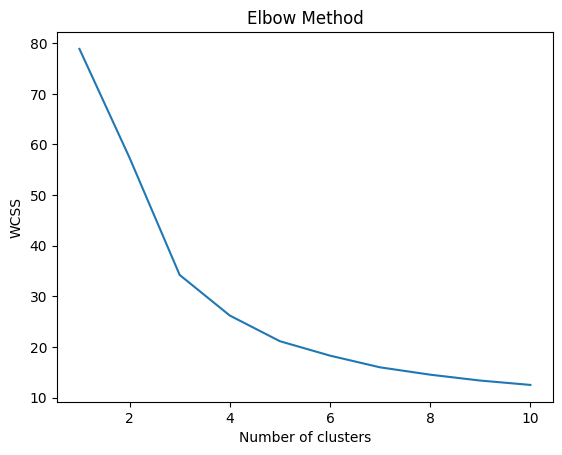

In [38]:
wcss = []
X = np.array(embedding_list)
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

# Plot the WCSS against the number of clusters
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [39]:
# Define the number of clusters you want to create
n_clusters = 6

# Create a KMeans clustering model with the specified number of clusters
kmeans = KMeans(n_clusters=n_clusters)

# Fit the model to the data
kmeans.fit(X)

# Get the cluster labels for each embedding
labels = kmeans.labels_

# Print the cluster labels for each embedding
for i, label in enumerate(labels):
    print(f"Embedding {i+1}: Cluster {label}")

Embedding 1: Cluster 2
Embedding 2: Cluster 3
Embedding 3: Cluster 0
Embedding 4: Cluster 5
Embedding 5: Cluster 4
Embedding 6: Cluster 0
Embedding 7: Cluster 0
Embedding 8: Cluster 0
Embedding 9: Cluster 0
Embedding 10: Cluster 5
Embedding 11: Cluster 3
Embedding 12: Cluster 4
Embedding 13: Cluster 2
Embedding 14: Cluster 0
Embedding 15: Cluster 0
Embedding 16: Cluster 0
Embedding 17: Cluster 3
Embedding 18: Cluster 4
Embedding 19: Cluster 0
Embedding 20: Cluster 3
Embedding 21: Cluster 2
Embedding 22: Cluster 0
Embedding 23: Cluster 0
Embedding 24: Cluster 1
Embedding 25: Cluster 0
Embedding 26: Cluster 0
Embedding 27: Cluster 3
Embedding 28: Cluster 0
Embedding 29: Cluster 3
Embedding 30: Cluster 3
Embedding 31: Cluster 0
Embedding 32: Cluster 0
Embedding 33: Cluster 0
Embedding 34: Cluster 3
Embedding 35: Cluster 3
Embedding 36: Cluster 0
Embedding 37: Cluster 4
Embedding 38: Cluster 4
Embedding 39: Cluster 0
Embedding 40: Cluster 0
Embedding 41: Cluster 5
Embedding 42: Cluster 2
E

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [40]:
column = ["Embedding"]
df = pd.DataFrame({'Embedding': embedding_list}, columns=column)
#df = pd.DataFrame(embedding_list, columns= column)

In [41]:
# Create a list to use as a new column
new_column = data["helpfulCount"]
# Assign the new column to the DataFrame
df['Helpful'] = new_column

In [42]:
labels = kmeans.labels_
df["Cluster"] = labels

In [43]:
df.tail(5)

,Embedding,Helpful,Cluster
623,"[0.09424068, 0.045330413, -0.16301723, -0.0887...",33,3
624,"[0.09576623, 0.045550115, -0.1699989, -0.09903...",5,3
625,"[-0.0033514202, 0.001477696, 0.031895936, 0.05...",34,1
626,"[0.097722314, 0.04637358, -0.17437449, -0.1029...",2,3
627,"[-0.0033514202, 0.001477696, 0.031895936, 0.05...",62,1


In [44]:
from scipy.stats import f_oneway

In [45]:
# Define the variable you want to analyze (e.g., concatenated helpfulness scores)
variable = 'Helpful'

# Group the data by cluster label and calculate the mean and variance of the variable for each cluster
grouped = df.groupby('Cluster')[variable].agg(['mean', 'var'])

# Convert the grouped data into a format suitable for the ANOVA function
cluster_means = [grouped.loc[label, 'mean'] for label in df['Cluster'].unique()]

# Perform the ANOVA test
f_value, p_value = f_oneway(*[df.loc[df['Cluster'] == label, variable] for label in df['Cluster'].unique()])

# Print the results
print('F-value:', f_value)
print('p-value:', p_value)


F-value: 0.9306523550966106
p-value: 0.4604457164709219


In [46]:
### ANOVA is used to determine whether there are statistically significant differences between the means of two or more groups
### The F-value represents the ratio of the variance between groups to the variance within groups. 
### A higher F-value indicates that the variation between groups is greater than the variation within groups
### which suggests that the groups are more different from each other.
### However, here the F-value is quite low, which suggests that the variation between groups is not much greater than the variation within groups.

In [47]:
### The p-value is quite high (0.7533), which suggests that there is not enough evidence to reject the null hypothesis 
### The groups are not significantly different.

In [48]:
from sklearn.cluster import KMeans
from scipy.stats import ttest_ind

In [49]:
num_clusters = 6

# Perform k-means clustering on the embeddings
kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(embedding_list)

# Get the clusters and their respective embeddings
clusters = [[] for _ in range(num_clusters)]
for i, embedding in enumerate(embedding_list):
    cluster_id = kmeans.labels_[i]
    #clusters[cluster_id].append(embedding)
    clusters[cluster_id].append((embedding, helpful[i]))
# Perform pairwise t-tests on the clusters
p_values = []
for i in range(num_clusters):
    for j in range(i + 1, num_clusters):
        cluster1 = clusters[i]
        cluster2 = clusters[j]      

        cluster1_helpfulness = [x[1] for x in cluster1]
        cluster2_helpfulness = [x[1] for x in cluster2]

        t_statistic, p_value = ttest_ind(cluster1_helpfulness, cluster2_helpfulness)
        print(f"P-value between clusters {i} and {j}: {p_value}")
    p_values.append(p_value)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


P-value between clusters 0 and 1: 0.03561743727441822
P-value between clusters 0 and 2: 0.015666218283320526
P-value between clusters 0 and 3: 0.014163014575758687
P-value between clusters 0 and 4: 0.14512543149610518
P-value between clusters 0 and 5: 0.18722317734939906
P-value between clusters 1 and 2: 0.017425992475852272
P-value between clusters 1 and 3: 0.5984967947569189
P-value between clusters 1 and 4: 0.0053313249016915835
P-value between clusters 1 and 5: 0.0003682375737324088
P-value between clusters 2 and 3: 0.0006133359465957723
P-value between clusters 2 and 4: 0.15077725132533976
P-value between clusters 2 and 5: 0.09805742727162242
P-value between clusters 3 and 4: 0.00032103822792906375
P-value between clusters 3 and 5: 2.577108688806773e-05
P-value between clusters 4 and 5: 0.7263773257848349


In [50]:
p_values

[0.18722317734939906,
 0.0003682375737324088,
 0.09805742727162242,
 2.577108688806773e-05,
 0.7263773257848349,
 0.7263773257848349]

In [51]:
# Identify the most helpful cluster based on the t-test results
most_helpful_cluster_id = p_values.index(min(p_values))
most_helpful_cluster_id

3

In [52]:
print("Members of the most helpful cluster:")
for i, label in enumerate(labels):
    if label == most_helpful_cluster_id:
        print(i)  # i is the index of the data point in the original dataset
        print(review_list[i])

Members of the most helpful cluster:
1
Why new permission without reason? Added finsky bind referer without statement of why or what for. Now added Advertising ID permission! Why does my government need to track me for advertising purposes?
10
Good app. However the new version makes seeing alerts from "Other locations" more difficult. All of my locations are "Main locations". I would really like to see all alerts for all locations on the main screen without heavy user interface mal-design needing multiple touches to see things.
16
Unable to open the app. It opens up then goes to a blank screen
19
All I get is a WHITE screen. With a hurricane bearing down on us, the Federal agency responsible for assisting us with info is striking out.
26
Amazing Thank you
28
They're not interested in helping the working class.
29
Hurrican Ian is coming thru Florida and it says nothing to update lol. Surrounding areas are flooded and I'm wanting to get evacuate updates
33
Keep me safe
34
Unusable. Makes

In [53]:
# Count the number of members in each cluster
cluster_sizes = [sum(labels == i) for i in range(n_clusters)]
print("Cluster sizes:", cluster_sizes)

Cluster sizes: [187, 46, 98, 155, 79, 63]
